<a href="https://www.kaggle.com/code/bajajakshay/default-prediction-amex?scriptVersionId=107962408" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [28]:
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

In [31]:
from imblearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import numpy as np

Load Training Data as DataFrame

In [6]:
train = pd.read_parquet(filename)

## Training data EDA

customer_ID = Unique Customer ID

D_* = Delinquency variables

S_* = Spend variables

P_* = Payment variables

B_* = Balance variables

R_* = Risk variables

Target labels 1 for Default, 0 for No Default

Categorical Features in the problem: 

['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']

In [7]:
train.head()

,customer_ID,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
0,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-03-09,0.938469,0.001733,0.008724,1.006838,0.009228,0.124035,0.008771,0.004709,...,NaN,NaN,0.002427,0.003706,0.003818,NaN,0.000569,0.000610,0.002674,0
1,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-04-07,0.936665,0.005775,0.004923,1.000653,0.006151,0.126750,0.000798,0.002714,...,NaN,NaN,0.003954,0.003167,0.005032,NaN,0.009576,0.005492,0.009217,0
2,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-05-28,0.954180,0.091505,0.021655,1.009672,0.006815,0.123977,0.007598,0.009423,...,NaN,NaN,0.003269,0.007329,0.000427,NaN,0.003429,0.006986,0.002603,0
3,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-06-13,0.960384,0.002455,0.013683,1.002700,0.001373,0.117169,0.000685,0.005531,...,NaN,NaN,0.006117,0.004516,0.003200,NaN,0.008419,0.006527,0.009600,0
4,0000099d6bd597052cdcda90ffabf56573fe9d7c79be5f...,2017-07-16,0.947248,0.002483,0.015193,1.000727,0.007605,0.117325,0.004653,0.009312,...,NaN,NaN,0.003671,0.004946,0.008889,NaN,0.001670,0.008126,0.009827,0


In [8]:
print("Number of rows in training dataset: ", train.shape[0])
print("Number of cols in training dataset: ", train.shape[1])
print("Total missing values in training dataset:", train.isna().sum().sum())
print("Total number of valid values in training dataset: ", (train.count().sum() - train.isna().sum().sum()))

Number of rows in training dataset:  5531451
Number of cols in training dataset:  191
Total missing values in training dataset: 160858968
Total number of valid values in training dataset:  734789205


In [9]:
print("Missing values by column name:\n",train.isna().sum().sort_values(ascending = False))

Missing values by column name:
 D_87      5527586
D_88      5525447
D_108     5502513
D_110     5500117
D_111     5500117
           ...   
B_24            0
D_75            0
P_4             0
B_23            0
target          0
Length: 191, dtype: int64


**Distribution of Data in training dataset(excluding target column)**

In [10]:
x = train.describe().T

In [11]:
x[:-1].sort_values(by='std', ascending = False).style.background_gradient()

,count,mean,std,min,25%,50%,75%,max
D_69,5336978.000000,0.154041,16.009655,0.000000,0.002585,0.005166,0.007750,13000.909180
R_14,5531450.000000,0.241438,8.356452,0.000000,0.002535,0.005070,0.007609,4837.304688
B_40,5531398.000000,0.203261,8.081345,0.000000,0.017393,0.058309,0.245154,5755.076172
B_10,5531451.000000,0.231600,4.799846,-0.002958,0.028991,0.110555,0.295539,4097.440918
B_26,5529435.000000,0.090620,2.588205,0.000000,0.002620,0.005237,0.007856,1499.220337
D_117,5354735.000000,2.319057,2.288730,-1.000000,-1.000000,3.000000,4.000000,6.000000
B_38,5529435.000000,2.716704,1.581322,1.000000,2.000000,2.000000,3.000000,7.000000
R_7,5531450.000000,0.088064,1.550873,0.000000,0.002569,0.005136,0.007703,449.988892
B_6,5531218.000000,0.152117,1.476770,-0.005178,0.020487,0.083385,0.191929,1214.516968
D_68,5314948.000000,5.012030,1.351339,0.000000,4.000000,6.000000,6.000000,6.000000


Null values distribution by column

In [12]:
train_null = train.isna().sum()

In [13]:
train_null = train_null.sort_values(ascending = False)
print(train_null)

D_87      5527586
D_88      5525447
D_108     5502513
D_110     5500117
D_111     5500117
           ...   
B_24            0
D_75            0
P_4             0
B_23            0
target          0
Length: 191, dtype: int64


In [14]:
train_null_nonull = train_null[train_null.values > 0]
print(train_null_nonull)

D_87     5527586
D_88     5525447
D_108    5502513
D_110    5500117
D_111    5500117
          ...   
B_37          56
R_12          56
B_40          53
R_7            1
R_14           1
Length: 122, dtype: int64


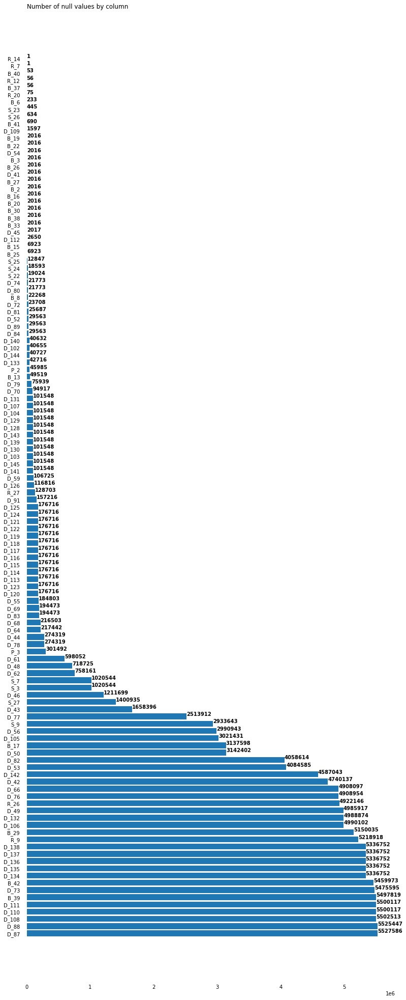

In [17]:
# Plot null values by column
fig, ax = plt.subplots(figsize =(13, 35))
ax.barh(train_null_nonull.index, train_null_nonull.values)
for s in ['top', 'bottom', 'left', 'right']:
    ax.spines[s].set_visible(False)
ax.xaxis.set_tick_params(pad = 5)
ax.yaxis.set_tick_params(pad = 10)
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 10, fontweight ='bold')
ax.set_title('Number of null values by column',
             loc ='left', )
plt.show()

Row Wise null value distribution

In [18]:
train_null_row = train.isna().sum(axis=1)
train_null_row = pd.DataFrame(train_null_row.value_counts()/train.shape[0]).reset_index()
train_null_row.columns = ['missing values', 'count']
train_null_row['count'] = train_null_row['count'] * 100

In [19]:
fig = px.bar(x = train_null_row['missing values'], y = train_null_row['count'])

In [20]:
# Plot the row wise null value distribution
fig.update_layout(title_text = "Missing values distribution by rows", xaxis_title = "No of rows", yaxis_title = "Percentage of values missing")
fig.show()

Target variable Distribution

In [23]:
train['target'].value_counts()

0    4153582
1    1377869
Name: target, dtype: int64

In [24]:
fig = px.pie(train, names='target')
fig.show()

Continous Features Distribution

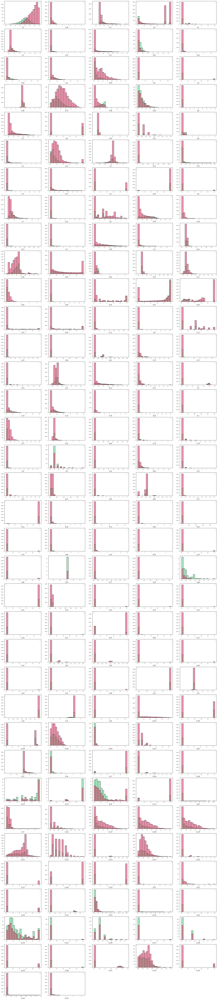

In [29]:
features = list(train.columns[2:190])
categorical_features = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
continous_features = [col for col in features if col not in categorical_features and 'target']

RANDOM_SPLIT = 100000
ncols = 5
nrows = 36
n_features = continous_features
fig, axes = plt.subplots(nrows, ncols, figsize=(25, 15*8))

for r in range(nrows):
    for c in range(ncols):
        if r*ncols+c == len(continous_features):
            break
        col = n_features[r*ncols+c]
        sns.histplot(data= train.iloc[:RANDOM_SPLIT],  x=col, ax=axes[r, c], hue= "target", bins = 20, palette =['#DE3163','#58D68D'])
        axes[r,c].legend()
        axes[r, c].set_ylabel('')
        axes[r, c].set_xlabel(col, fontsize=8)
        axes[r, c].tick_params(labelsize=5, width=0.5)
        axes[r, c].xaxis.offsetText.set_fontsize(6)
        axes[r, c].yaxis.offsetText.set_fontsize(4)
fig.delaxes(axes[35][2])
fig.delaxes(axes[35][3])   
fig.delaxes(axes[35][4])
plt.show()

Categorical Columns Distribution

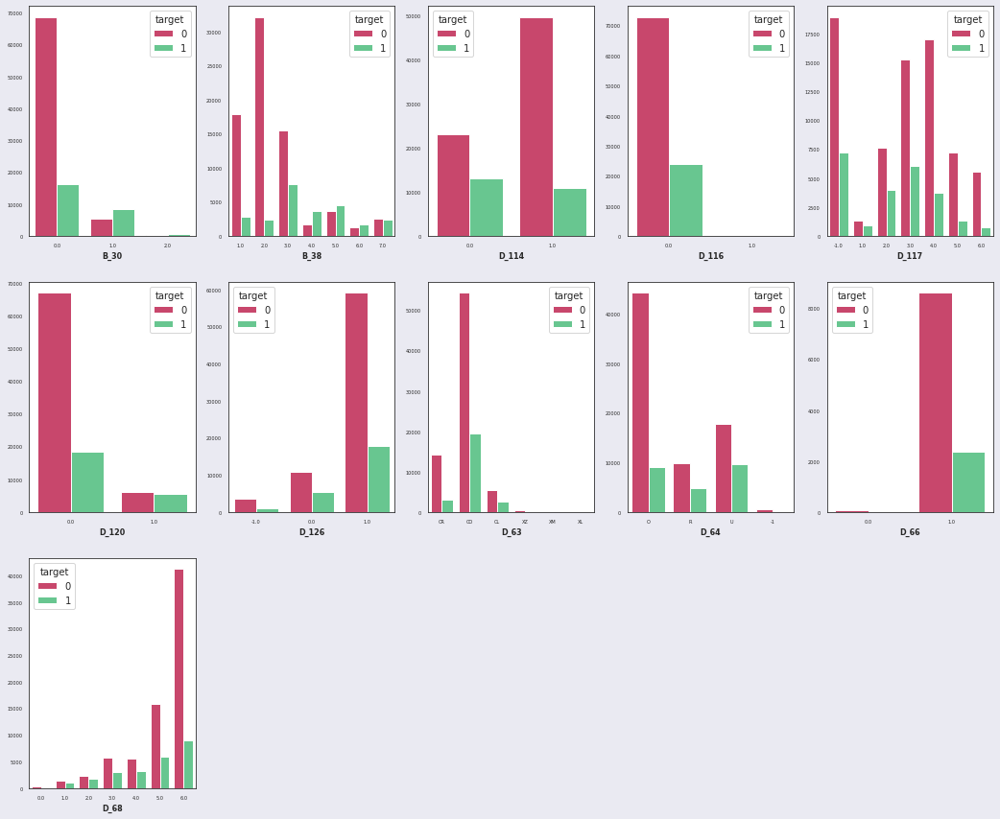

In [30]:
sns.set_style(style='white')
ncols = 5
nrows = int(len(categorical_features) / ncols + (len(features) % ncols > 0)) 

fig, axes = plt.subplots(nrows, ncols, figsize=(18, 15), facecolor='#EAEAF2')

for r in range(nrows):
    for c in range(ncols):
        if r*ncols+c >= len(cat_features):
            break
        col = cat_features[r*ncols+c]
        sns.countplot(data=train.iloc[:RANDOM_SPLIT] , x = col, ax=axes[r, c], hue = "target", palette =['#DE3163','#58D68D'])
        axes[r, c].set_ylabel('')
        axes[r, c].set_xlabel(col, fontsize=8, fontweight='bold')
        axes[r, c].tick_params(labelsize=5, width=0.5)
        axes[r, c].xaxis.offsetText.set_fontsize(4)
        axes[r, c].yaxis.offsetText.set_fontsize(4)
fig.delaxes(axes[2][1])     
fig.delaxes(axes[2][2]) 
fig.delaxes(axes[2][3]) 
fig.delaxes(axes[2][4]) 
plt.show()

# Model 1
# Multi-layer Perceptron neural network model to predict Credit Card Default

Import necessary libraries:

In [15]:
from imblearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import numpy as np

Define constants and model hyperparameters

In [2]:
categorical_cols = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
filename = '../input/amex-parquet/train_data.parquet'
columns_to_remove = []
data_size = 1200000
random_state = 42
activation = 'logistic'
hidden_layer_size = (250,)
solver='adam'
learning_rate = 0.001
batch_size = 1024
verbose = True
max_iter = 200

Find the columns with >= 75% missing values

In [6]:
def find_cols_to_remove(filename):
    cols_to_remove = []
    train = pd.read_parquet(filename)
    for col in train.columns:
        if train[col].isna().sum()/len(train[col]) >= 0.75:
            cols_to_remove.append(col)
    return cols_to_remove

In [7]:
cols_to_remove = find_cols_to_remove(filename)

Data Preprocessing steps:
1. Remove Columns with >= 75% missing values
2. Cast categorical columns as 'str' type so they can be imputed later
3. Remove S_2 which is the timestamp column and customer_ID from the training data
4. Remove 'target' column from the training dataset
5. Split the dataset into training and validation sets in 85% and 15% respectively

In [8]:
def preprocess_cols(train, cols_to_remove, categorical_cols):
    for col in cols_to_remove:
        train.drop(labels=col, axis=1, inplace=True)
        if col in categorical_cols:
            categorical_cols.remove(col)
    train = train.astype({"B_30": 'str', "B_38": 'str'})
    train = train.astype({"D_114": 'str', "D_116": 'str', "D_117": 'str', "D_120": 'str', "D_126": 'str',"D_63": 'str',"D_64":'str', "D_68":'str'})
    train.drop(columns = ['customer_ID', 'S_2'],axis=1, inplace = True)
    numerical_cols = list(train.select_dtypes('number').columns)
    numerical_cols.remove('target')
    X = train.drop(columns = 'target')
    y = train['target']
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.15, stratify = y, random_state = random_state)
    del train
    return x_train, x_test, y_train, y_test, numerical_cols, categorical_cols

# Pipeline Steps:
* **Preprocessing for categorical data:**
1. Impute missing values with most_frequent imputation strategy
2. One-hot encode all categorical values
3. Centre and Scale values

* **Preprocessing for numerical data:**
1. Impute missing values with most_frequent
2. Centre and Scale values

* **Oversampling and Undersampling**

Use SMOTE oversampling and RandomUnderSampler to undersample to account for imbalance in training data

* Feature Selection
Use sklearn SelectFromModel to find the most important features in the training data using RandomForest model

* Dimension Reduction
Using Principal component analysis, number of components to keep is estimated by max likelihood estimation

* Model estimator 
The model to fit, ie, Multi Layer Perceptron model with hyperparameters defined previousy

In [9]:
mlpclassifier = MLPClassifier(hidden_layer_sizes = hidden_layer_size, activation = activation, learning_rate_init = learning_rate, solver= solver, verbose = verbose, batch_size = batch_size, random_state = random_state, max_iter = max_iter)

In [10]:
def make_pipeline(categorical_cols, numerical_cols):
    categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy = 'most_frequent', missing_values = np.nan)),
    ('encoder', OneHotEncoder(handle_unknown = 'ignore', sparse = False)),
    ('scaler', StandardScaler())
    ])
    numerical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy = 'most_frequent', missing_values = np.nan)),
    ('scalar', StandardScaler())
    ])
    preprocess_pipeline = ColumnTransformer([
    ('categorical', categorical_pipeline, categorical_cols),
    ('continous', numerical_pipeline, numerical_cols)
    ])
    
    pipeline = Pipeline([
    ('preprocess_pipeline', preprocess_pipeline),
    ('over_sampler', SMOTE()),
    ('under_sampler', RandomUnderSampler()),
    ('feature_selection', SelectFromModel(RandomForestClassifier(n_estimators = 200, n_jobs = -1))),
    ('dimension_reduction', PCA(n_components = 'mle')),
    ('model_estimator', mlpclassifier),
    ], verbose = verbose)
    return pipeline

Parameters for the model

In [11]:
mlpclassifier.get_params()

{'activation': 'logistic',
 'alpha': 0.0001,
 'batch_size': 1024,
 'beta_1': 0.9,
 'beta_2': 0.999,
 'early_stopping': False,
 'epsilon': 1e-08,
 'hidden_layer_sizes': (250,),
 'learning_rate': 'constant',
 'learning_rate_init': 0.001,
 'max_fun': 15000,
 'max_iter': 200,
 'momentum': 0.9,
 'n_iter_no_change': 10,
 'nesterovs_momentum': True,
 'power_t': 0.5,
 'random_state': 42,
 'shuffle': True,
 'solver': 'adam',
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': True,
 'warm_start': False}

Function returns first 'data_size' rows from file

In [12]:
def get_data(filename, data_size):
    train = pd.read_parquet(filename)
    train = train[0:data_size]
    return train

In [13]:
train = get_data(filename, data_size)
x_train, x_test, y_train, y_test, numerical_cols, categorical_cols = preprocess_cols(train, cols_to_remove, categorical_cols)
del train

In [16]:
pipeline = make_pipeline(categorical_cols, numerical_cols)

In [23]:
print("Number of rows in training dataset:", len(x_train.index))
print("Number of rows in test dataset:", len(x_test.index))

Number of rows in training dataset: 1020000
Number of rows in test dataset: 180000


In [19]:
model = pipeline.fit(x_train, y_train)

[Pipeline]  (step 1 of 6) Processing preprocess_pipeline, total=  38.2s
[Pipeline] ...... (step 2 of 6) Processing over_sampler, total=31.0min
[Pipeline] ..... (step 3 of 6) Processing under_sampler, total=   1.5s
[Pipeline] . (step 4 of 6) Processing feature_selection, total=75.0min
[Pipeline]  (step 5 of 6) Processing dimension_reduction, total=   7.7s
Iteration 1, loss = 0.35030663
Iteration 2, loss = 0.33662251
Iteration 3, loss = 0.33123944
Iteration 4, loss = 0.32724255
Iteration 5, loss = 0.32385335
Iteration 6, loss = 0.32068341
Iteration 7, loss = 0.31776138
Iteration 8, loss = 0.31463846
Iteration 9, loss = 0.31150145
Iteration 10, loss = 0.30862767
Iteration 11, loss = 0.30583625
Iteration 12, loss = 0.30314213
Iteration 13, loss = 0.30060628
Iteration 14, loss = 0.29819857
Iteration 15, loss = 0.29589879
Iteration 16, loss = 0.29371950
Iteration 17, loss = 0.29177369
Iteration 18, loss = 0.28987949
Iteration 19, loss = 0.28820261
Iteration 20, loss = 0.28655504
Iteration 21

/opt/conda/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


In [25]:
test_accuracy = model.score(x_test, y_test)

In [27]:
print(f"The accuracy of the model on validation dataset is: {round(test_accuracy * 100, 2)}%")

The accuracy of the model on validation dataset is: 86.84%


# Model 2

# Keras Gradient Boosted Trees model to predict Credit Card Default

In [1]:
import pandas as pd
import tensorflow_decision_forests as tfdf
from tensorflow_decision_forests.keras import GradientBoostedTreesModel as gbtm
from tensorflow_decision_forests.keras import pd_dataframe_to_tf_dataset as df_to_tf
from tensorflow import keras

In [2]:
categorical_cols = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
filename = '../input/amex-parquet/train_data.parquet'
columns_to_remove = []
data_size = 1000000
cols_to_remove = ['D_42', 'D_49', 'D_66', 'D_73', 'D_76', 'R_9', 'B_29', 'D_87', 'D_88', 'D_106', 'R_26', 'D_108', 'D_110', 'D_111', 
                  'B_39', 'B_42', 'D_132', 'D_134', 'D_135', 'D_136', 'D_137', 'D_138', 'D_142']

verbose = 0
num_trees = 500
max_depth = 6
min_examples = 4
missing_value_policy = 'GLOBAL_IMPUTATION'
allow_na_conditions = False
shrinkage = 0.07
validation_ratio = 0.1
early_stopping = 'LOSS_INCREASE'

In [3]:
def preprocess_cols(train, cols_to_remove, categorical_cols):
    for col in cols_to_remove:
        train.drop(labels=col, axis=1, inplace=True)
        if col in categorical_cols:
            categorical_cols.remove(col)
    train = train.astype({"B_30": 'str', "B_38": 'str'})
    train = train.astype({"D_114": 'str', "D_116": 'str', "D_117": 'str', "D_120": 'str', "D_126": 'str',"D_63": 'str',"D_64":'str', "D_68":'str'})
    train.drop(columns = ['customer_ID', 'S_2'],axis=1, inplace = True)
    numerical_cols = list(train.select_dtypes('number').columns)
    numerical_cols.remove('target')
    return train, numerical_cols, categorical_cols

In [4]:
def fit_model(filename, categorical_cols):
    train = pd.read_parquet(filename)
    train = train[0:1020000]
    train, numerical_cols, categorical_cols = preprocess_cols(train, cols_to_remove, categorical_cols)
    model = gbtm(verbose=verbose,
            num_trees = num_trees,
            max_depth = max_depth,
            min_examples = min_examples,
            missing_value_policy = missing_value_policy,
            allow_na_conditions = allow_na_conditions,
            shrinkage = shrinkage,
            validation_ratio = validation_ratio,
            early_stopping = early_stopping)
    model.compile(metrics=["acc"])
    model.fit(df_to_tf(train, label = 'target'))
    model.save('./model_gradBoosted')
    return model

In [5]:
model_gradBoosted = fit_model(filename, categorical_cols)

2022-09-19 17:15:33.335622: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.
/opt/conda/lib/python3.7/site-packages/tensorflow_decision_forests/keras/core.py:1612: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  features_dataframe = dataframe.drop(label, 1)
2022-09-19 17:15:44.118830: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


15938/15938 [==============================] - 192s 12ms/step


[INFO kernel.cc:736] Start Yggdrasil model training
[INFO kernel.cc:737] Collect training examples
[INFO kernel.cc:392] Number of batches: 15938
[INFO kernel.cc:393] Number of examples: 1020000
[INFO kernel.cc:759] Dataset:
Number of records: 1020000
Number of columns: 166

Number of columns by type:
	NUMERICAL: 155 (93.3735%)
	CATEGORICAL: 11 (6.62651%)

Columns:

NUMERICAL: 155 (93.3735%)
	0: "B_1" NUMERICAL mean:0.124374 min:-1.53572 max:1.32406 sd:0.212483
	1: "B_10" NUMERICAL mean:0.231252 min:-0.00295743 max:4097.44 sd:6.46468
	2: "B_11" NUMERICAL mean:0.111271 min:3.70907e-08 max:1.76775 sd:0.208651
	3: "B_12" NUMERICAL mean:0.0941121 min:3.5683e-07 max:212.309 sd:0.737326
	4: "B_13" NUMERICAL num-nas:8975 (0.879902%) mean:0.10098 min:1.90585e-08 max:188.813 sd:0.587599
	5: "B_14" NUMERICAL mean:0.101405 min:-4.17595 max:45.0047 sd:0.291938
	6: "B_15" NUMERICAL num-nas:1170 (0.114706%) mean:0.0535482 min:-2.86536 max:52.0471 sd:0.313368
	7: "B_16" NUMERICAL num-nas:368 (0.036078

In [8]:
%whos

Variable               Type                         Data/Info
-------------------------------------------------------------
allow_na_conditions    bool                         False
categorical_cols       list                         n=10
cols_to_remove         list                         n=23
columns_to_remove      list                         n=0
data_size              int                          1000000
df_to_tf               function                     <function pd_dataframe_to<...>ataset at 0x7f71731ef7a0>
early_stopping         str                          LOSS_INCREASE
evaluate_model         function                     <function evaluate_model at 0x7f715aed7cb0>
filename               str                          ../input/amex-parquet/train_data.parquet
fit_model              function                     <function fit_model at 0x7f71731909e0>
gbtm                   type                         <class 'tensorflow_decisi<...>adientBoostedTreesModel'>
keras                  mod

In [9]:
def evaluate_model(model, filename, categorical_cols):
    test = pd.read_parquet(filename)
    test = train[1020000:1200000]
    test, numerical_cols, categorical_cols = preprocess_cols(test, cols_to_remove, categorical_cols)
    _, accuracy = model_gradBoosted.evaluate(df_to_tf(train, label = 'target'))
    print(f"\nTest accuracy for Gradient Boosted Trees Model is: {round(accuracy * 100, 2)}%")
    del train
    return accuracy

In [11]:
results = evaluate_model(model_gradBoosted, filename, categorical_cols)

/opt/conda/lib/python3.7/site-packages/tensorflow_decision_forests/keras/core.py:1612: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  features_dataframe = dataframe.drop(label, 1)


2813/2813 [==============================] - 43s 15ms/step - loss: 0.0000e+00 - acc: 0.8756

Test accuracy for Gradient Boosted Trees Model is: 87.56%
